# Milestone One: International Football

Farhan Falahaqil Rafi

FTDS-BSD-003

In my role as a Data Analyst at a sports analytics firm, I am embarking on a comprehensive project to analyze historical trends in international football, spanning from the early days of the sport to the modern era. This analysis, conducted for a leading sports magazine, leverages the extensive "International Football Results from 1872 to 2017" dataset. The project aims to unravel the intricate web of international football matches, offering insights into the evolution of the sport, its geopolitical impact, and the shifts in playing styles over time.

## Dashboard

https://public.tableau.com/app/profile/farhan.rafi5440/viz/FarhansHistoricalFootballDashboard/Dashboard1?publish=yes

# Problem Identification

## SMART Analysis

- **Specific**: Examining key trends and networks in international football, with a special focus on connectivity, dominant teams, and historical rivalries.
- **Measurable**: Analyzing specific metrics such as the frequency of matches, goal-scoring trends, and the prevalence of home vs. away advantages.
- **Achievable**: With a rich dataset and targeted statistical methods, the project aims to provide meaningful insights within a defined scope.
- **Relevant**: This analysis is crucial for understanding the historical and contemporary dynamics of international football, appealing to sports historians, analysts, and enthusiasts alike.
- **Time-bound**: The analysis spans a comprehensive period from 1872 to 2017, offering a historical and contemporary view of the sport's evolution.

## Introduction and Background
The world of international football, a sport that has transcended its origins as a local pastime to become a global spectacle, is a rich tapestry of history, culture, and competition. This sport not only unites billions of fans worldwide but also reflects a complex interplay of geopolitical, social, and technological changes. Particularly in events like the FIFA World Cup, football has shown its incredible power to captivate and unite diverse audiences. In this analysis, I aim to delve deep into the "International Football Results from 1872 to 2017" dataset, uncovering the intricate patterns and trends that have defined the sport over more than a century.

## Problem Statement
This project is structured as a comprehensive exploration of international football, guided by a targeted analysis of historical match data. The objective is to dissect and understand the evolution of football through various lenses—how the game has changed, which nations have dominated the sport, and how playing styles have evolved. By employing the "International Football Results from 1872 to 2017" dataset, this study seeks to illuminate the key trends in match outcomes, scoring patterns, and team performances, offering a detailed overview of how these elements have transformed across different eras of football.

## Elaboration of the Problem (5W + 1H)
- **Who**: Identifying and analyzing the dominant teams in the annals of international football, understanding their rise and impact on the sport.
- **What**: Investigating prevalent trends in match outcomes, goal-scoring patterns, and strategic evolutions in playing styles.
- **When**: Pinpointing key periods that marked significant changes in football, be it due to rule modifications, tactical innovations, or external factors like world events.
- **Where**: Highlighting regions and countries that have been pivotal in shaping the landscape of international football.
- **Why**: Exploring the underlying factors that contribute to team success, the popularity of the sport, and shifts in global football dynamics.
- **How**: Assessing how the format of football competitions and tournaments has evolved, influencing the way the game is played and perceived.

By integrating data visualizations and statistical analysis, this project will provide deep insights into both historical and contemporary trends in international football. The goal is to offer a well-rounded and insightful overview of the sport's evolution, drawing connections between the past and present to understand the future trajectory of international football.

# Data Loading

## SQL Queries

### Selecting the Goalscorers Table for Export

```SELECT * FROM goalscorers```

### Selecting the Results Table for Export

```SELECT * FROM results```

### Selecting the Shootouts Table for Export

```SELECT * FROM shootouts```

## Importing Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import networkx as nx

## Retrieving and Importing the Dataset

In [2]:
# importing match results
df_results = pd.read_csv('results.csv')

# importing goalscorer data
df_goalscorers = pd.read_csv('goalscorers.csv')

# importing penalty shootout data
df_shootouts = pd.read_csv('shootouts.csv')

## Elementary Data Analysis

### Results

In [3]:
# displaying the first five rows of the match results
df_results.head()

,date,home_team,away_team,home_score,away_score,tournament,city,country,neutral
0,1872-11-30,Scotland,England,0,0,Friendly,Glasgow,Scotland,False
1,1873-03-08,England,Scotland,4,2,Friendly,London,England,False
2,1874-03-07,Scotland,England,2,1,Friendly,Glasgow,Scotland,False
3,1875-03-06,England,Scotland,2,2,Friendly,London,England,False
4,1876-03-04,Scotland,England,3,0,Friendly,Glasgow,Scotland,False


In [4]:
# displaying information
df_results.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45315 entries, 0 to 45314
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   date        45315 non-null  object
 1   home_team   45315 non-null  object
 2   away_team   45315 non-null  object
 3   home_score  45315 non-null  int64 
 4   away_score  45315 non-null  int64 
 5   tournament  45315 non-null  object
 6   city        45315 non-null  object
 7   country     45315 non-null  object
 8   neutral     45315 non-null  bool  
dtypes: bool(1), int64(2), object(6)
memory usage: 2.8+ MB


In [5]:
# looking at the numerics
df_results.describe()

,home_score,away_score
count,45315.000000,45315.000000
mean,1.739314,1.178241
std,1.746904,1.392095
min,0.000000,0.000000
25%,1.000000,0.000000
50%,1.000000,1.000000
75%,2.000000,2.000000
max,31.000000,21.000000


In [6]:
# displaying unique countries
df_results.home_team.value_counts()

home_team
Brazil                       600
Argentina                    580
Mexico                       567
Germany                      533
England                      530
                            ... 
Central Spain                  1
Madrid                         1
Saint Pierre and Miquelon      1
Sark                           1
Hmong                          1
Name: count, Length: 313, dtype: int64

In [7]:
# displaying the most likely score for the home team
df_results.home_score.value_counts()

home_score
1     13429
0     10959
2      9941
3      5305
4      2758
5      1311
6       711
7       383
8       207
9       126
10       66
11       36
12       27
13       16
14       12
15        8
16        6
19        3
17        3
21        2
30        1
24        1
18        1
20        1
22        1
31        1
Name: count, dtype: int64

In [8]:
# displaying the most likely score for the away team 
df_results.away_score.value_counts()

away_score
0     16883
1     14665
2      7858
3      3333
4      1385
5       576
6       292
7       144
8        71
9        36
10       25
12        8
13        7
11        7
15        6
18        5
16        3
20        3
17        3
14        2
19        2
21        1
Name: count, dtype: int64

#### Initial Insights

- **Countries No Longer in Existence**: I noticed that the dataset includes countries that have undergone significant geopolitical changes and may no longer exist under the same name. This aspect offers an intriguing historical perspective on the sport and its intersection with global politics. I plan to approach these cases with consideration, deciding whether to group them with their modern equivalents or to analyze them as distinct entities. This decision will be crucial for maintaining accuracy and relevance in my analysis.

- **Matches Predating FIFA**: The dataset intriguingly contains records of matches before FIFA's establishment in 1904. This inclusion suggests a comprehensive historical scope. However, I'll need to verify the authenticity and sources of these early records. Given the evolution of the sport's rules and structures since then, any analysis of this period will require careful contextualization.

- **Home Team Scoring Trends**: An interesting pattern I observed is that home teams are more likely to score one goal. This aligns with the concept of 'home advantage,' where teams perform better on familiar ground, buoyed by local fan support and spared the rigors of travel. I plan to delve deeper into this trend to assess its consistency across different eras, regions, and levels of play.

- **Away Team Scoring Trends**: Conversely, away teams seem more inclined to score zero goals, likely reflecting the challenges of playing in unfamiliar settings without supportive crowds. This trend complements the home advantage theory and opens up avenues for exploring how external factors like travel, climate, and venue characteristics impact team performance.

To enhance my analysis, I'll explore the following:

- **Impact of Historical and Political Events**: By correlating match data with significant global events, I aim to understand how football has been influenced by the world around it.

- **Evolution of Home and Away Advantage**: I'm curious about how these dynamics have changed over time and across different competitions.

- **Influence of External Factors on Away Teams**: Factors such as travel distance, climate differences, and altitude could significantly impact the performance of away teams. I plan to investigate these aspects further.

- **Comparison of Pre- and Post-FIFA Era Matches**: This comparison could reveal FIFA's impact on the global governance and evolution of football.

### Goalscorers

In [9]:
# displaying the first five rows
df_goalscorers.head()

,date,home_team,away_team,team,scorer,minute,own_goal,penalty
0,1916-07-02,Chile,Uruguay,Uruguay,José Piendibene,44.0,False,False
1,1916-07-02,Chile,Uruguay,Uruguay,Isabelino Gradín,55.0,False,False
2,1916-07-02,Chile,Uruguay,Uruguay,Isabelino Gradín,70.0,False,False
3,1916-07-02,Chile,Uruguay,Uruguay,José Piendibene,75.0,False,False
4,1916-07-06,Argentina,Chile,Argentina,Alberto Ohaco,2.0,False,False


In [10]:
# diplaying dataframe information
df_goalscorers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43189 entries, 0 to 43188
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   date       43189 non-null  object 
 1   home_team  43189 non-null  object 
 2   away_team  43189 non-null  object 
 3   team       43189 non-null  object 
 4   scorer     43139 non-null  object 
 5   minute     42929 non-null  float64
 6   own_goal   43187 non-null  object 
 7   penalty    43187 non-null  object 
dtypes: float64(1), object(7)
memory usage: 2.6+ MB


In [11]:
# describing numericals
df_goalscorers.describe()

,minute
count,42929.000000
mean,50.040206
std,26.363782
min,1.000000
25%,28.000000
50%,51.000000
75%,73.000000
max,122.000000


In [12]:
# looking at the goalscorers
df_goalscorers.scorer.value_counts()

scorer
Cristiano Ronaldo     111
Robert Lewandowski     62
Romelu Lukaku          61
Harry Kane             55
Lionel Messi           54
                     ... 
Francis Were            1
Pablo Paz               1
Dainius Suliauskas      1
Haidar Abdullah         1
Fotis Ioannidis         1
Name: count, Length: 13909, dtype: int64

In [13]:
# displaying null values
df_goalscorers.isnull().sum()

date           0
home_team      0
away_team      0
team           0
scorer        50
minute       260
own_goal       2
penalty        2
dtype: int64

#### Initial insights

- **Start Year – 1916**: Contrary to expectations, the dataset begins in 1916, not in 1872, which marked the year of the first official international football match. This gap suggests a lack of recorded data for the sport's early years, which could limit the historical scope of my analysis. I intend to explore why earlier data might be missing and consider how this might influence the comprehensiveness and historical accuracy of my findings.

- **Presence of Null Values**: I observed null values in several columns, notably 'scorer,' 'minute,' 'own_goal,' and 'penalty.' The absence of this information presents a challenge in fully understanding match dynamics and individual player contributions. I'll assess the extent of these null values and determine the best approach for handling them, whether it's imputation, removal, or a different form of data cleaning, to maintain the integrity of the analysis.

- **Recent Players as Top Scorers**: A notable trend is that the top scorers in the dataset are all recent players. This finding could point to an evolution in playing styles, training techniques, or even changes in football's rules that favor higher scoring games. I plan to investigate this trend in detail to understand whether it reflects a genuine shift in the sport or a bias in data collection towards more recent matches.

To deepen my analysis, I'll consider the following aspects:

- **Historical Coverage**: I'll explore the reasons behind the dataset starting in 1916 and assess how this affects the analysis of football's evolution.

- **Data Completeness and Reliability**: The presence of null values raises questions about data completeness. I'll explore ways to address these gaps without compromising the analysis's integrity.

- **Scoring Trends Over Time**: The prevalence of recent players among top scorers is intriguing. I'll examine scoring trends over time to see if there's a noticeable shift in the frequency or manner of goals being scored.

- **Impact of Rule Changes and Training Techniques**: Understanding if and how changes in football rules and training techniques have influenced scoring will add depth to my analysis.

### Shootouts

In [14]:
# displaying top 5 rows
df_shootouts.head()

,date,home_team,away_team,winner,first_shooter
0,1967-08-22,India,Taiwan,Taiwan,NaN
1,1971-11-14,South Korea,Vietnam Republic,South Korea,NaN
2,1972-05-07,South Korea,Iraq,Iraq,NaN
3,1972-05-17,Thailand,South Korea,South Korea,NaN
4,1972-05-19,Thailand,Cambodia,Thailand,NaN


In [15]:
# displaying dataframe information
df_shootouts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 562 entries, 0 to 561
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   date           562 non-null    object
 1   home_team      562 non-null    object
 2   away_team      562 non-null    object
 3   winner         562 non-null    object
 4   first_shooter  86 non-null     object
dtypes: object(5)
memory usage: 22.1+ KB


#### Initial Insights

- **Time Span and Historical Context**: The dataset spans from 1967 onwards, capturing the evolution of penalty shootouts in football over several decades.

- **Data Completeness**: There are missing values in key columns like first_shooter, which could impact the analysis of which team usually takes the initiative in shootouts.

- **Geographical Diversity**: The dataset includes teams from various countries, reflecting the global reach and diversity of football.

- **Limitation in Statistics**: The dataset lacks detailed statistics like total shots taken or specific scores of each shootout, which restricts more in-depth analysis.

- **Potential for Trend Analysis**: Due to the limited amount of data, I might not end up using this dataset. We'll see where this goes later.

# Data Cleaning

## Cleaning Results

In [16]:
#making a list of the column names
columns = df_results.columns

print('Unique Values in Results per Column\n')
#iterationg for every column
for i in range(0,8):
    #printing each column label and unique content
    print(f'{columns[i]}: {df_results.iloc[:,i].unique()}\n')

Unique Values in Results per Column

date: ['1872-11-30' '1873-03-08' '1874-03-07' ... '2023-11-19' '2023-11-20'
 '2023-11-21']

home_team: ['Scotland' 'England' 'Wales' 'Northern Ireland' 'United States' 'Uruguay'
 'Austria' 'Hungary' 'Argentina' 'Belgium' 'France' 'Netherlands'
 'Czechoslovakia' 'Switzerland' 'Sweden' 'Germany' 'Italy' 'Chile'
 'Norway' 'Finland' 'Luxembourg' 'Russia' 'Denmark' 'Catalonia'
 'Basque Country' 'Brazil' 'Japan' 'Paraguay' 'Canada' 'Estonia'
 'Costa Rica' 'Guatemala' 'Spain' 'Brittany' 'Poland' 'Yugoslavia'
 'New Zealand' 'Romania' 'Latvia' 'Galicia' 'Portugal' 'Andalusia'
 'China PR' 'Australia' 'Lithuania' 'Turkey' 'Central Spain' 'Mexico'
 'Aruba' 'Egypt' 'Haiti' 'Philippines' 'Bulgaria' 'Jamaica' 'Kenya'
 'Bolivia' 'Peru' 'Honduras' 'Guyana' 'Uganda' 'Belarus' 'El Salvador'
 'Barbados' 'Republic of Ireland' 'Trinidad and Tobago' 'Greece' 'Curaçao'
 'Dominica' 'Silesia' 'Guadeloupe' 'Israel' 'Suriname' 'French Guiana'
 'Cuba' 'Colombia' 'Ecuador' 'Sain

In [17]:
# displaying information
df_results.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45315 entries, 0 to 45314
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   date        45315 non-null  object
 1   home_team   45315 non-null  object
 2   away_team   45315 non-null  object
 3   home_score  45315 non-null  int64 
 4   away_score  45315 non-null  int64 
 5   tournament  45315 non-null  object
 6   city        45315 non-null  object
 7   country     45315 non-null  object
 8   neutral     45315 non-null  bool  
dtypes: bool(1), int64(2), object(6)
memory usage: 2.8+ MB


In [18]:
# changing date from object to date
df_results['date'] = pd.to_datetime(df_results['date'])
df_results.date.dtype

dtype('<M8[ns]')

## Cleaning Goalscorers

In [19]:
#making a list of the column names
columns = df_goalscorers.columns

print('Unique Values in Goalscorers per Column\n')
#iterationg for every column
for i in range(0,8):
    #printing each column label and unique content
    print(f'{columns[i]}: {df_goalscorers.iloc[:,i].unique()}\n')

Unique Values in Goalscorers per Column

date: ['1916-07-02' '1916-07-06' '1916-07-08' ... '2023-11-19' '2023-11-20'
 '2023-11-21']

home_team: ['Chile' 'Argentina' 'Brazil' 'Uruguay' 'Paraguay' 'Bolivia' 'Peru'
 'Latvia' 'Estonia' 'Belgium' 'France' 'Lithuania' 'Sweden' 'Yugoslavia'
 'Poland' 'Switzerland' 'Haiti' 'Republic of Ireland' 'Mexico'
 'Luxembourg' 'Spain' 'Egypt' 'Portugal' 'Bulgaria' 'Italy' 'Israel'
 'Netherlands' 'Austria' 'Hungary' 'Romania' 'Czechoslovakia' 'Germany'
 'Finland' 'Norway' 'Greece' 'Cuba' 'Ecuador' 'Colombia' 'United States'
 'Northern Ireland' 'Wales' 'Scotland' 'England' 'Turkey' 'Japan'
 'Saarland' 'South Korea' 'Hong Kong' 'Guatemala' 'Sudan' 'Costa Rica'
 'Indonesia' 'Denmark' 'German DR' 'Syria' 'China PR' 'Canada' 'Russia'
 'Curaçao' 'Iceland' 'Ethiopia' 'Ghana' 'Honduras' 'Nigeria' 'Suriname'
 'Taiwan' 'Morocco' 'Cyprus' 'Tunisia' 'Malta' 'Albania' 'India' 'Jamaica'
 'Trinidad and Tobago' 'Venezuela' 'DR Congo' 'Ivory Coast' 'North Korea'
 'Austra

In [20]:
# displaying goalscorer info
df_goalscorers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43189 entries, 0 to 43188
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   date       43189 non-null  object 
 1   home_team  43189 non-null  object 
 2   away_team  43189 non-null  object 
 3   team       43189 non-null  object 
 4   scorer     43139 non-null  object 
 5   minute     42929 non-null  float64
 6   own_goal   43187 non-null  object 
 7   penalty    43187 non-null  object 
dtypes: float64(1), object(7)
memory usage: 2.6+ MB


In [21]:
df_goalscorers.isnull().sum()

date           0
home_team      0
away_team      0
team           0
scorer        50
minute       260
own_goal       2
penalty        2
dtype: int64

In [22]:
df_goalscorers.dropna(inplace=True)

In [23]:
# changing date from object to date
df_goalscorers['date'] = pd.to_datetime(df_goalscorers['date'])
df_goalscorers.date.dtype

dtype('<M8[ns]')

In [24]:
# changing date from object to date
df_goalscorers['own_goal'] = df_goalscorers['own_goal'].astype(bool)
df_goalscorers.own_goal.dtype

dtype('bool')

In [25]:
# changing date from object to date
df_goalscorers['penalty'] = df_goalscorers['penalty'].astype(bool)
df_goalscorers.penalty.dtype

dtype('bool')

In [26]:
df_goalscorers['minute'] = df_goalscorers['minute'].astype(int)
df_goalscorers.minute.dtype

dtype('int32')

In [27]:
df_goalscorers.describe()

,date,minute
count,42929,42929.000000
mean,1997-11-14 13:30:02.893149056,50.040206
min,1916-07-02 00:00:00,1.000000
25%,1988-06-18 00:00:00,28.000000
50%,2002-09-07 00:00:00,51.000000
75%,2013-09-06 00:00:00,73.000000
max,2023-11-21 00:00:00,122.000000
std,NaN,26.363782


# Data Analysis

## Results

### Dominant Teams in Football

In [28]:
# function to determine the winner of a match
def determine_winner(row):
    if row['home_score'] > row['away_score']:
        return row['home_team']
    elif row['home_score'] < row['away_score']:
        return row['away_team']
    else:
        return 'Draw'

# apply the function to each row
df_results['winner'] = df_results.apply(determine_winner, axis=1)

# count wins for each team
win_counts = df_results['winner'].value_counts()

# remove 'Draw' to focus only on teams
win_counts = win_counts.drop('Draw')

# display top dominant teams
dominant_teams = win_counts.head(10)  # You can adjust the number to see more or fewer teams
print(dominant_teams)

winner
Brazil         659
England        605
Germany        577
Argentina      564
Sweden         525
Mexico         487
South Korea    483
Hungary        459
Italy          450
France         450
Name: count, dtype: int64


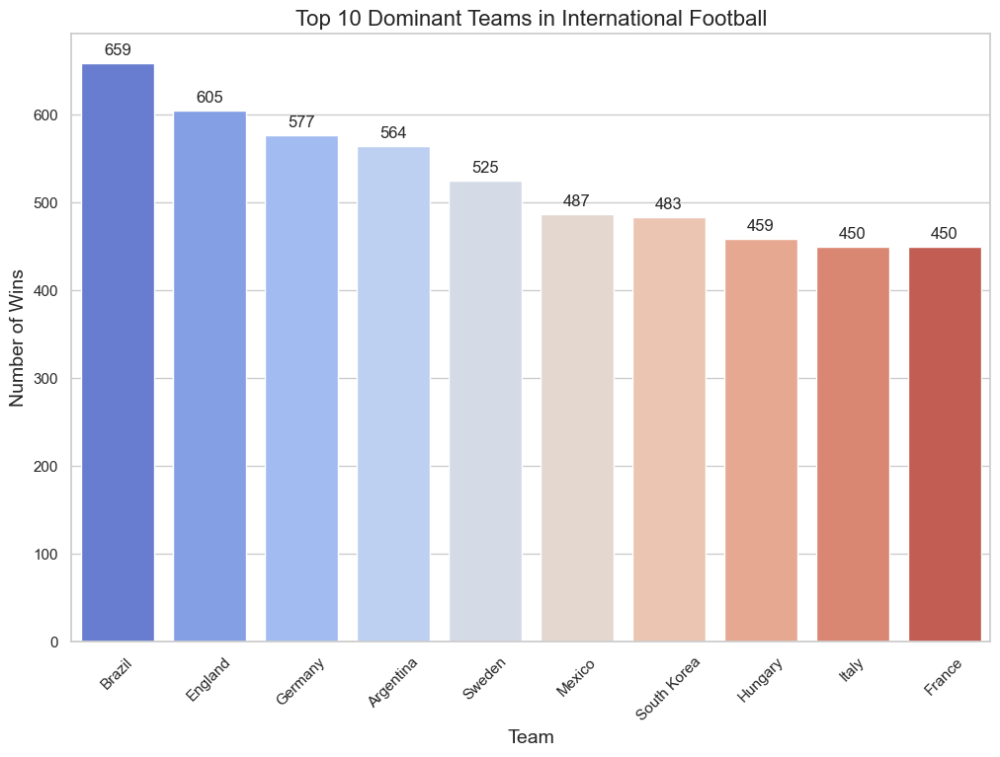

In [29]:
# setting the aesthetic style of the plots
sns.set(style="whitegrid")

# creating the plot
plt.figure(figsize=(12, 8))
ax = sns.barplot(x=dominant_teams.index, y=dominant_teams.values, hue=dominant_teams.index, palette="coolwarm")

# adding titles and labels
plt.title('Top 10 Dominant Teams in International Football', fontsize=16)
plt.xlabel('Team', fontsize=14)
plt.ylabel('Number of Wins', fontsize=14)

# rotating x-labels for better readability
plt.xticks(rotation=45)

# adding the value on top of each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

plt.show()

In [30]:
# counting total games and wins for each team
total_games_home = df_results['home_team'].value_counts()
total_games_away = df_results['away_team'].value_counts()
total_games = total_games_home.add(total_games_away, fill_value=0)

wins = df_results['winner'].value_counts()

# calculating win percentage
win_percentage = (wins / total_games).dropna().sort_values(ascending=False) * 100

# filtering teams with at least 100 games
min_games = 500
win_percentage = win_percentage[total_games >= min_games]

# top 10 teams by win percentage
top_win_percentage = win_percentage.head(10)

top_win_percentage

Brazil         63.856589
Spain          58.411844
Germany        57.873621
England        57.129367
Iran           55.992509
Argentina      54.651163
Italy          53.066038
South Korea    52.786885
Netherlands    51.500600
Mexico         51.048218
Name: count, dtype: float64

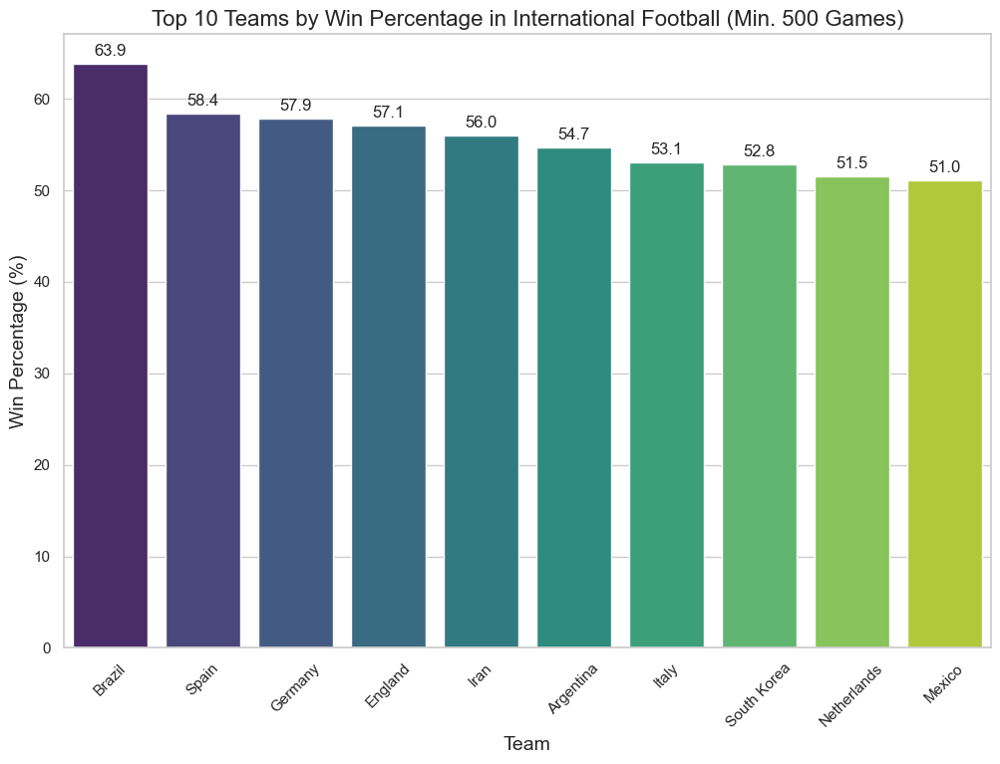

In [31]:
# visualizing the top win percentages
plt.figure(figsize=(12, 8))
ax = sns.barplot(x=top_win_percentage.index, y=top_win_percentage.values, hue=top_win_percentage.index, palette="viridis")

plt.title('Top 10 Teams by Win Percentage in International Football (Min. 500 Games)', fontsize=16)
plt.xlabel('Team', fontsize=14)
plt.ylabel('Win Percentage (%)', fontsize=14)
plt.xticks(rotation=45)

# adding the value on top of each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

plt.show()

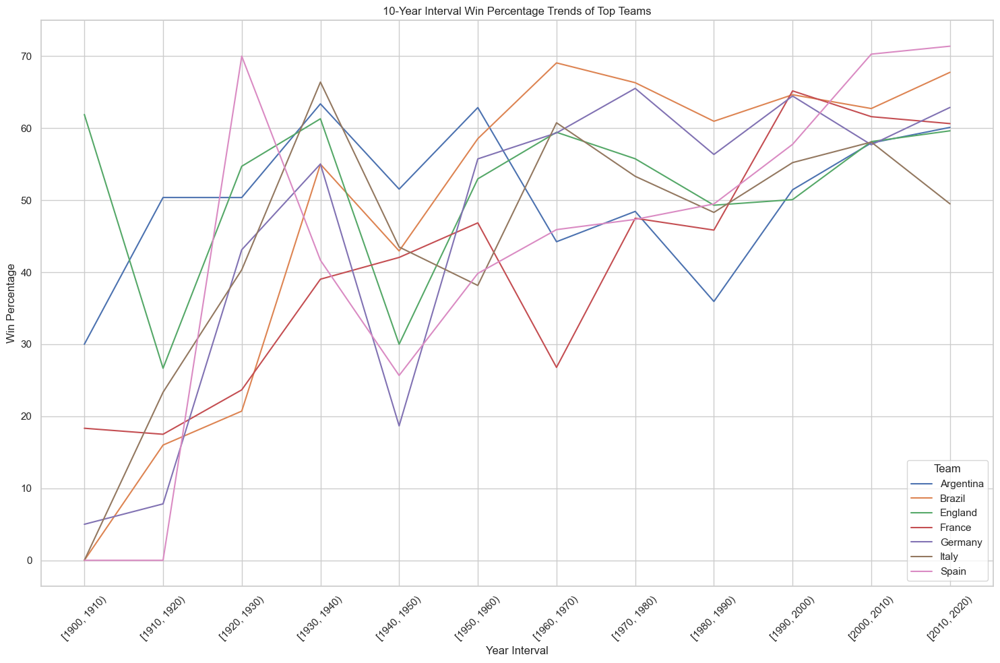

In [52]:
# create a function to calculate win percentages
def calculate_win_percentage(df_results, team):
    """Calculate win percentage for a given team."""
    total_games = df_results[(df_results['home_team'] == team) | (df_results['away_team'] == team)]
    wins = total_games[((total_games['home_team'] == team) & (total_games['home_score'] > total_games['away_score'])) | 
                   ((total_games['away_team'] == team) & (total_games['away_score'] > total_games['home_score']))]
    return len(wins) / len(total_games) * 100 if len(total_games) > 0 else 0

# create a list of top teams for this analysis
top_teams = ["Brazil", "Spain", "Germany", "England", "Argentina", "Italy", "France"]
df_results['year'] = pd.to_datetime(df_results['date']).dt.year 

# calculating yearly win percentage for each team
yearly_data = []

for team in top_teams:
    for year in df_results['year'].unique():
        yearly_win_percent = calculate_win_percentage(df_results[df_results['year'] == year], team)
        yearly_data.append({'Team': team, 'Year': year, 'Win_Percentage': yearly_win_percent})

yearly_df_results = pd.DataFrame(yearly_data)

# grouping the win percentage by 10-year intervals for each team
yearly_df_results['Year_Group'] = pd.cut(yearly_df_results['Year'], bins=range(1900, 2025, 10), right=False)
grouped_df_results = yearly_df_results.groupby(['Team', 'Year_Group'], observed=True).mean().reset_index()

# convert Year_Group to string for plotting
grouped_df_results['Year_Group'] = grouped_df_results['Year_Group'].astype(str)

# visualizing the trend over time using seaborn
plt.figure(figsize=(15, 10))
sns.lineplot(data=grouped_df_results, x='Year_Group', y='Win_Percentage', hue='Team')
plt.title('10-Year Interval Win Percentage Trends of Top Teams')
plt.xlabel('Year Interval')
plt.ylabel('Win Percentage')
plt.xticks(rotation=45)
plt.legend(title='Team')
plt.tight_layout()
plt.show()

In [33]:
# identify top 20 teams
top_teams = top_win_percentage.sort_values(ascending=False).head(20).index.tolist()

# calculate the number of matches played by each team
match_counts = df_results['home_team'].value_counts() + df_results['away_team'].value_counts()

# filter teams that have played at least 500 matches
teams_with_100_matches = match_counts[match_counts >= 500].index.tolist()

# calculate win pct vs top teams 
def win_percentage_against_top_teams(team, top_teams):
    """Calculate a team's win percentage against top teams."""
    # filter matches where 'team' played against any of the top teams
    matches_against_top = df_results[((df_results['home_team'] == team) | (df_results['away_team'] == team)) &
                                     ((df_results['home_team'].isin(top_teams)) | (df_results['away_team'].isin(top_teams)))]

    # calculate wins against top teams
    wins_against_top = matches_against_top[((matches_against_top['home_team'] == team) & (matches_against_top['home_score'] > matches_against_top['away_score'])) |
                                       ((matches_against_top['away_team'] == team) & (matches_against_top['away_score'] > matches_against_top['home_score']))]


    return len(wins_against_top) / len(matches_against_top) * 100 if len(matches_against_top) > 0 else 0

# calculate win percentage against top teams for teams with at least 500 matches
win_percent_against_top_df = pd.DataFrame({'Team': teams_with_100_matches})
win_percent_against_top_df['Win_Percentage_Against_Top'] = win_percent_against_top_df['Team'].apply(lambda team: win_percentage_against_top_teams(team, top_teams))

# display results
win_percent_against_top_df.sort_values('Win_Percentage_Against_Top', ascending=False, inplace=True)
win_percent_against_top_df.head(20)


,Team,Win_Percentage_Against_Top
7,Brazil,63.856589
60,Spain,58.411844
22,Germany,57.873621
18,England,57.129367
30,Iran,55.992509
1,Argentina,54.651163
32,Italy,53.066038
59,South Korea,52.786885
43,Netherlands,51.500600
41,Mexico,51.048218


In [34]:
win_percent_against_top_df

,Team,Win_Percentage_Against_Top
7,Brazil,63.856589
60,Spain,58.411844
22,Germany,57.873621
18,England,57.129367
30,Iran,55.992509
...,...,...
63,Tanzania,0.000000
38,Malawi,0.000000
68,Uganda,0.000000
19,Estonia,0.000000


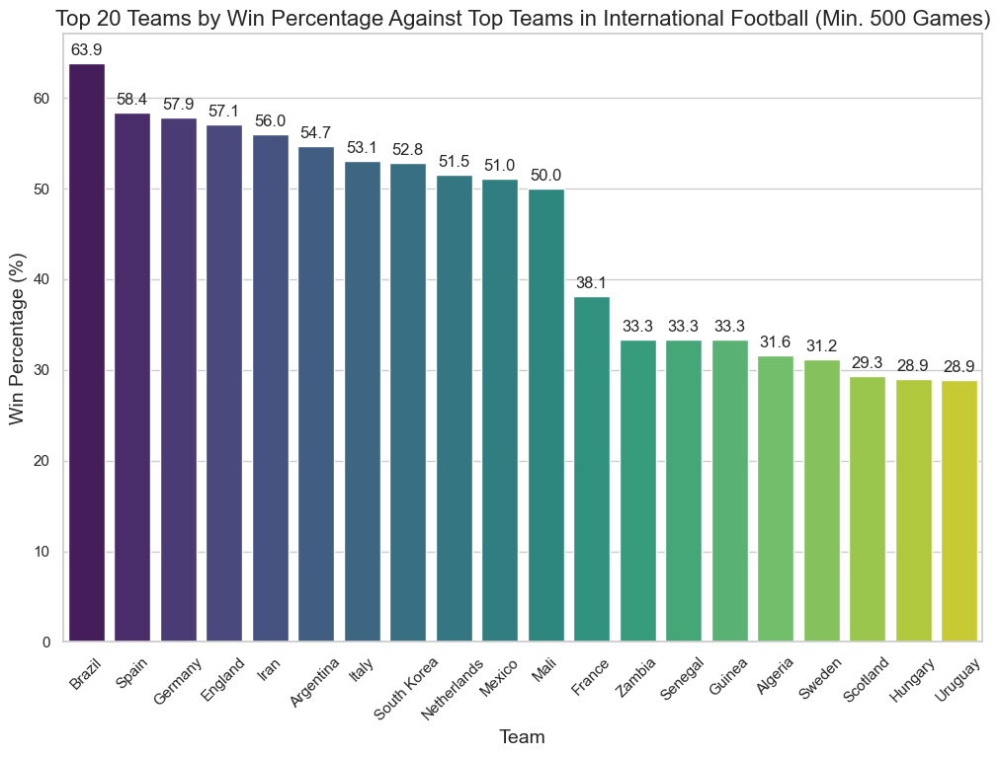

In [35]:
# taking the top 20 results only
temp_df = win_percent_against_top_df.head(20)

# visualizing the top win percentages against top countries
plt.figure(figsize=(12, 8))
ax = sns.barplot(x=temp_df.Team, y=temp_df.Win_Percentage_Against_Top, hue=temp_df.Team, palette="viridis", legend=False)

plt.title('Top 20 Teams by Win Percentage Against Top Teams in International Football (Min. 500 Games)', fontsize=16)
plt.xlabel('Team', fontsize=14)
plt.ylabel('Win Percentage (%)', fontsize=14)
plt.xticks(rotation=45)

# adding the value on top of each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

plt.show()

#### Key Insights

1. **Top Winners in Number of Matches**:
   - Brazil leads with the highest number of wins (659), followed by England (605) and Germany (577). This indicates a strong and consistent performance by these teams in international football over the years.
   - Notably, Sweden and South Korea are also among the top 10 winners, which might be surprising considering the usual dominance of European and South American teams. Their presence highlights the global nature of the sport and the potential for success beyond traditional football powerhouses.

2. **Winning Percentage**:
   - Brazil not only has the most wins but also the highest win percentage (63.86%), reaffirming their dominance in international football.
   - Spain, despite having fewer total wins compared to some other teams, has a high win percentage (58.41%), indicating efficiency and effectiveness in their play.
   - The presence of Iran among the top five teams by win percentage (55.99%) is remarkable, suggesting a strong performance in the matches they have played, even though they might have played fewer matches compared to traditional football giants.

3. **Win Percentage Against Top Teams**:
   - Mali, with a 50% win rate against top teams, stands out, suggesting they perform exceptionally well against strong opponents despite perhaps not having a high overall win rate.
   - Traditional powerhouses like France, Uruguay, and Belgium show strong performances against top teams, which is consistent with their reputations in international football.
   - It's interesting to note that some highly successful teams in general (like Brazil, Germany, or Argentina) are not in the top 10 for win percentages against top teams. This could indicate either that they haven't played as many matches against top-tier teams or that their success is more evenly spread against all types of opponents.

4. **Geographical Diversity**:
   - The representation of teams from different continents in these lists (Europe, South America, Asia, Africa) illustrates the global diversity of football. It shows that while certain regions have historically dominated, there is a competitive spirit and a high level of football being played worldwide.

5. **Performance Dynamics**:
   - The difference in rankings between total wins and win percentages against top teams suggests varying strategies and performance dynamics. Some teams might excel in consistently winning against a broader range of opponents, while others perform exceptionally well in high-stakes matches against top-tier teams.

In conclusion, these insights provide a fascinating glimpse into the competitive landscape of international football, highlighting both the dominance of traditional powerhouses and the impressive performances of less heralded teams, especially in high-pressure matches against top opponents. This diversity and unpredictability add to the excitement and global appeal of the sport.

### Home vs. Away

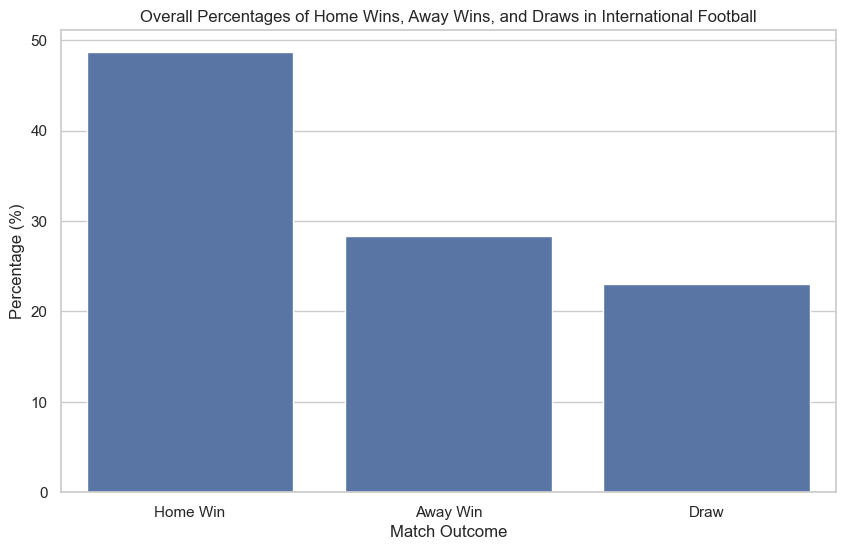

In [36]:
# categorizing match results
df_results['Match_Outcome'] = 'Draw'
df_results.loc[df_results['home_score'] > df_results['away_score'], 'Match_Outcome'] = 'Home Win'
df_results.loc[df_results['home_score'] < df_results['away_score'], 'Match_Outcome'] = 'Away Win'

# calculating the overall percentages
outcome_counts = df_results['Match_Outcome'].value_counts()
outcome_percentages = outcome_counts / outcome_counts.sum() * 100

# converting to dataFrame for easy plotting
outcome_df = outcome_percentages.reset_index()
outcome_df.columns = ['Outcome', 'Percentage']

# plotting the results
plt.figure(figsize=(10, 6))
sns.barplot(x='Outcome', y='Percentage', data=outcome_df)
plt.title('Overall Percentages of Home Wins, Away Wins, and Draws in International Football')
plt.xlabel('Match Outcome')
plt.ylabel('Percentage (%)')
plt.show()


Home Goals - Mean: 1.7393136930376256, Median: 1.0, Mode: 1, Std Dev: 1.7469038472406049
Away Goals - Mean: 1.1782412004854905, Median: 1.0, Mode: 0, Std Dev: 1.3920954301743274


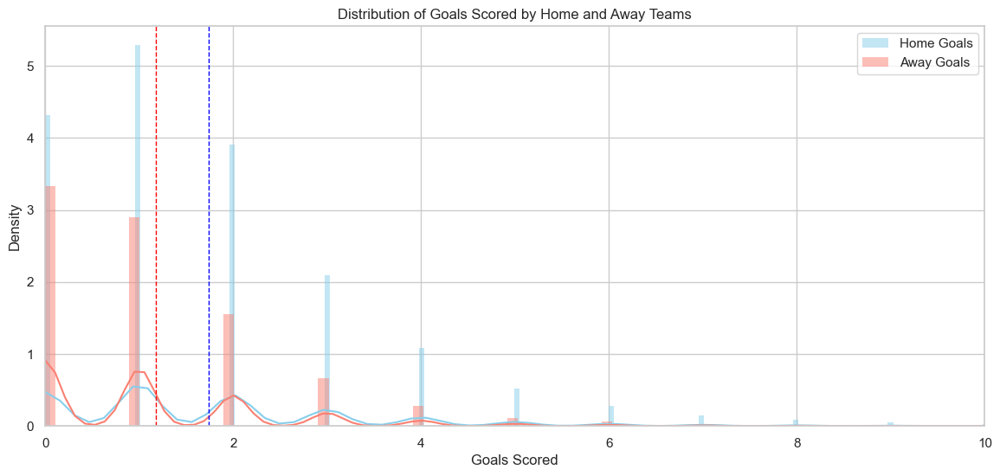

In [54]:
# extract home and away scores
home_scores = df_results['home_score']
away_scores = df_results['away_score']

# calculate statistical measures
home_mean = home_scores.mean()
away_mean = away_scores.mean()
home_median = home_scores.median()
away_median = away_scores.median()
home_mode = home_scores.mode()[0]
away_mode = away_scores.mode()[0]
home_std = home_scores.std()
away_std = away_scores.std()

# print the statistical measures
print(f"Home Goals - Mean: {home_mean}, Median: {home_median}, Mode: {home_mode}, Std Dev: {home_std}")
print(f"Away Goals - Mean: {away_mean}, Median: {away_median}, Mode: {away_mode}, Std Dev: {away_std}")

# create histograms for the distribution of goals
plt.figure(figsize=(14, 6))
sns.histplot(home_scores, color="skyblue", label="Home Goals", kde=True, stat="density", linewidth=0)
sns.histplot(away_scores, color="salmon", label="Away Goals", kde=True, stat="density", linewidth=0)
plt.title("Distribution of Goals Scored by Home and Away Teams")
plt.xlabel("Goals Scored")
plt.ylabel("Density")
plt.axvline(home_mean, color='blue', linestyle='dashed', linewidth=1)
plt.axvline(away_mean, color='red', linestyle='dashed', linewidth=1)
plt.legend()

# limiting x-axis to 10
plt.xlim(0, 10)

plt.show()


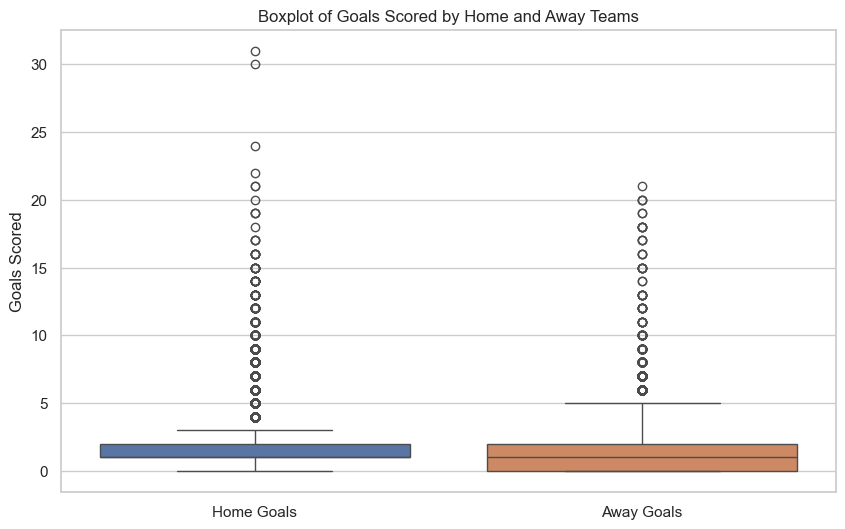

In [55]:
# combine the scores into a single dataFrame for boxplot
scores_df = pd.DataFrame({'Home Goals': home_scores, 'Away Goals': away_scores})

# create boxplots
plt.figure(figsize=(10, 6))
sns.boxplot(data=scores_df)
plt.title("Boxplot of Goals Scored by Home and Away Teams")
plt.ylabel("Goals Scored")

# display the plot
plt.show()

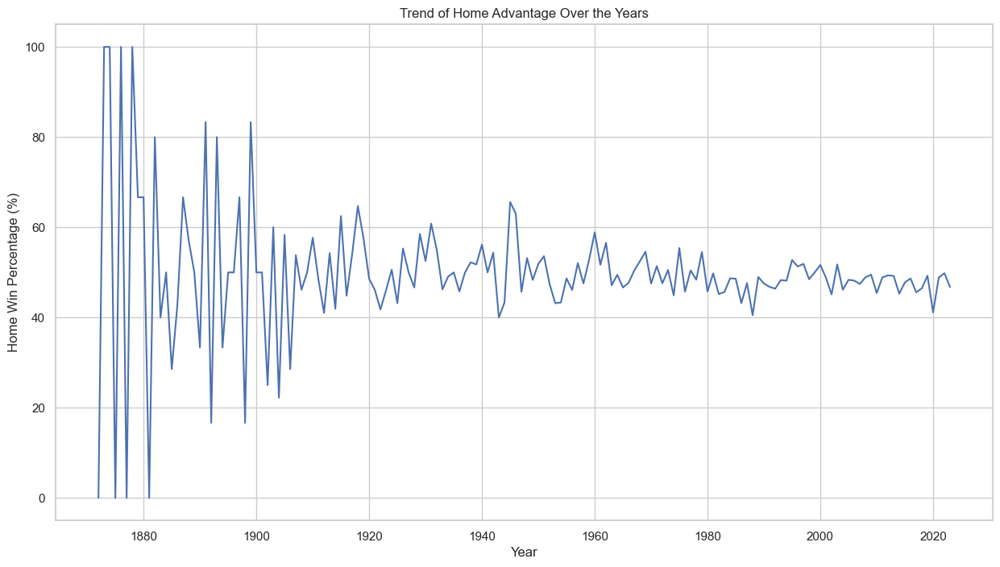

In [37]:
# extracting the year from the date
df_results['Year'] = pd.to_datetime(df_results['date']).dt.year

# function to calculate home win percentage for a given year
def home_win_percentage(year, df):
    year_data = df[df['Year'] == year]
    home_wins = year_data[year_data['home_score'] > year_data['away_score']]
    return len(home_wins) / len(year_data) * 100 if len(year_data) > 0 else np.nan

# calculating home win percentage for each year
yearly_home_advantage = df_results['Year'].unique()
yearly_home_advantage.sort()
home_advantage_percentages = [home_win_percentage(year, df_results) for year in yearly_home_advantage]

# creating a dataFrame for visualization
home_advantage_df = pd.DataFrame({'Year': yearly_home_advantage, 'Home Win Percentage': home_advantage_percentages})

# visualizing the trend
plt.figure(figsize=(15, 8))
sns.lineplot(data=home_advantage_df, x='Year', y='Home Win Percentage')
plt.title('Trend of Home Advantage Over the Years')
plt.xlabel('Year')
plt.ylabel('Home Win Percentage (%)')
plt.show()

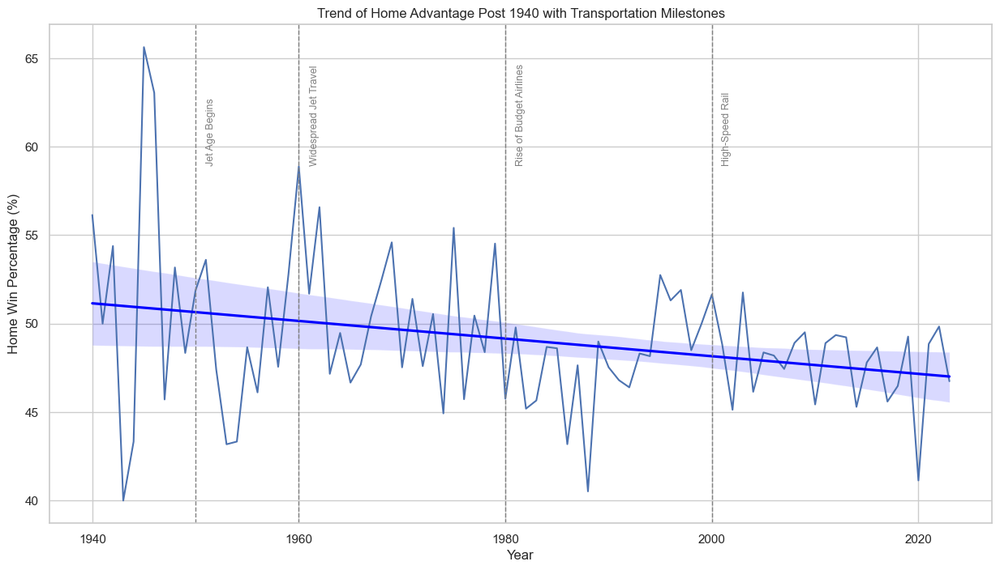

In [38]:
# filtering the dataFrame for visualization post 1940
filtered_home_advantage_df = home_advantage_df[home_advantage_df['Year'] >= 1940]

# visualizing the trend with transportation milestones for years post 1940
plt.figure(figsize=(15, 8))
sns.lineplot(data=filtered_home_advantage_df, x='Year', y='Home Win Percentage')

# adding a trend line
sns.regplot(data=filtered_home_advantage_df, x='Year', y='Home Win Percentage', scatter=False, color='blue')

# adding milestones (post 1940)
milestones = {
    1950: 'Jet Age Begins',
    1960: 'Widespread Jet Travel',
    1980: 'Rise of Budget Airlines',
    2000: 'High-Speed Rail'
}

max_home_win_percentage = filtered_home_advantage_df['Home Win Percentage'].max()
for year, event in milestones.items():
    plt.axvline(x=year, color='gray', linestyle='--', lw=1)
    plt.text(year + 1, max_home_win_percentage * 0.90, event, rotation=90, color='gray', fontsize=9)

plt.title('Trend of Home Advantage Post 1940 with Transportation Milestones')
plt.xlabel('Year')
plt.ylabel('Home Win Percentage (%)')
plt.show()


In [39]:
from sklearn.linear_model import LinearRegression

# fitting a linear model
model = LinearRegression()
model.fit(filtered_home_advantage_df[['Year']], filtered_home_advantage_df['Home Win Percentage'])

# getting the slope (gradient) of the trend line
slope = model.coef_[0]
print("Slope of the trend line: ", slope)

Slope of the trend line:  -0.04983529010403567


#### Null Hypothesis Testing

- **Null Hypothesis (H₀)**: "There is no significant difference in the mean scores of home teams compared to away teams in international football matches."

- **Alternative Hypothesis (H₁)**: "There is a significant difference in the mean scores of home teams compared to away teams in international football matches."

In [40]:
# extract home and away scores
home_scores = df_results['home_score']
away_scores = df_results['away_score']

# perform the t-test
t_stat, p_value = stats.ttest_ind(home_scores, away_scores, equal_var=False)

# output the results
print(f"T-Statistic: {t_stat}")
print(f"P-Value: {p_value}")

# decide whether to reject the null hypothesis
alpha = 0.05  # significance level
if p_value < alpha:
    print("Reject the null hypothesis - there is a significant difference in mean scores.")
else:
    print("Fail to reject the null hypothesis - there is no significant difference in mean scores.")

T-Statistic: 53.46960609889571
P-Value: 0.0
Reject the null hypothesis - there is a significant difference in mean scores.


#### Insight on Home and Away Match Outcomes:
The analysis of home and away match outcomes from 1940 onwards reveals a notable trend in international football. The data shows that home teams have a significant advantage, with approximately 48.68% of matches resulting in a home win, compared to 28.33% for away wins, and 22.99% for draws. This "home advantage" is a well-recognized phenomenon in sports, often attributed to factors such as familiar playing conditions, support from local fans, and the absence of travel fatigue.

**Statistical Analysis of Goal Scoring:**

- Home Goals: The mean score for home teams is approximately 1.74 goals per match, with a median and mode of 1. This indicates that the most common and central tendency for home team scores is around 1-2 goals per match. The standard deviation of 1.75 suggests variability around this average.
- Away Goals: Away teams have a lower mean score of about 1.18 goals per match. The median and mode are 1 and 0, respectively, indicating that away teams are more likely to score fewer goals, commonly none or one goal per match. The standard deviation of 1.39 points to a slightly less variable but generally lower scoring pattern for away teams.

A statistical hypothesis test supports this observation, with a t-statistic of 53.4696 and a p-value of 0.0, strongly suggesting a significant difference in mean scores between home and away teams. This reinforces the concept of home advantage being more than just a perceived bias.

Moreover, a linear regression analysis on home win percentages from 1940 to the present day indicates a gradual decline in this home advantage over time. The slope of the trend line is approximately -0.0498. This negative slope suggests a slow but steady reduction in the home win percentage over the years. This could be attributed to improvements in transportation, leading to less travel-related fatigue for away teams, as well as the globalization of football, which might be leveling the playing field.

The added historical milestones in transportation development help contextualize these changes. For instance, the beginning of the Jet Age in the 1950s and the rise of budget airlines in the 1980s likely contributed to this trend, making it easier for teams to travel, thus somewhat mitigating the home field advantage.

This trend of diminishing home advantage raises intriguing questions about the evolving nature of international football and suggests a shift towards a more balanced playing field in the sport.

### Scoring Trends

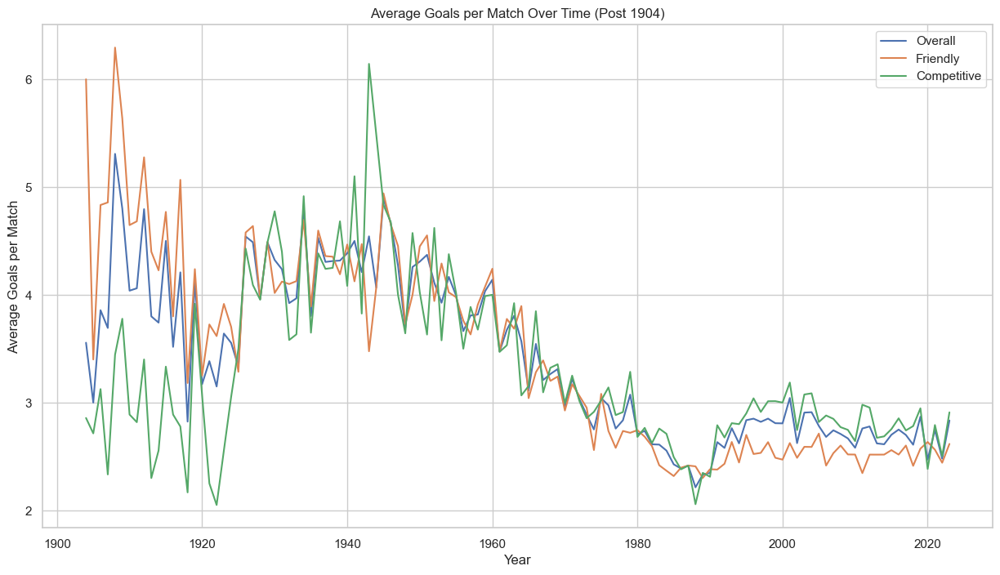

In [41]:
# filter the data to include only the years from 1904 onwards (formation of FIFA)
df_results_post_1904 = df_results[df_results['year'] >= 1904].copy()
df_results_post_1904['total_goals'] = df_results_post_1904['home_score'] + df_results_post_1904['away_score']

# calculate total goals scored each year post 1904
yearly_goals_post_1904 = df_results_post_1904.groupby('year')['total_goals'].sum()
yearly_matches_post_1904 = df_results_post_1904.groupby('year').size()

# calculate average goals per match for the period post 1904
avg_goals_per_year_post_1904 = yearly_goals_post_1904 / yearly_matches_post_1904

# repeat the process for friendly and competitive matches post 1904
friendly_matches_post_1904 = df_results_post_1904[df_results_post_1904['tournament'] == 'Friendly']
competitive_matches_post_1904 = df_results_post_1904[df_results_post_1904['tournament'] != 'Friendly']

friendly_goals_post_1904 = friendly_matches_post_1904.groupby('year')['total_goals'].sum()
friendly_match_count_post_1904 = friendly_matches_post_1904.groupby('year').size()
avg_friendly_goals_post_1904 = friendly_goals_post_1904 / friendly_match_count_post_1904

competitive_goals_post_1904 = competitive_matches_post_1904.groupby('year')['total_goals'].sum()
competitive_match_count_post_1904 = competitive_matches_post_1904.groupby('year').size()
avg_competitive_goals_post_1904 = competitive_goals_post_1904 / competitive_match_count_post_1904

# plotting
plt.figure(figsize=(15, 8))
sns.lineplot(data=avg_goals_per_year_post_1904, label='Overall')
sns.lineplot(data=avg_friendly_goals_post_1904, label='Friendly')
sns.lineplot(data=avg_competitive_goals_post_1904, label='Competitive')
plt.title('Average Goals per Match Over Time (Post 1904)')
plt.xlabel('Year')
plt.ylabel('Average Goals per Match')
plt.legend()
plt.show()

#### Key Insights

**Trend in Friendly Matches:**

- The early 1900s show a high average of goals scored in friendly matches, with a peak around 1908.
- A general decrease in average goals is noticeable from the 1970s onwards, with the number stabilizing around 2.5 to 3 goals per match in recent years.
- This trend might indicate a shift in playing styles or defensive strategies becoming more effective over time in friendly matches.

**Trend in Competitive Matches:**

- Competitive matches exhibit a different pattern compared to friendlies. The mid-20th century, particularly the 1930s to 1950s, shows higher scoring games, which might reflect a more open style of play during this era.
- There's a noticeable decrease in goals per match from the 1970s, similar to friendly matches, but the average goals remain slightly higher in competitive games.
- The average goals in competitive matches also appear to stabilize around 3 goals per match in recent years.

**Comparative Insights:**

- Competitive matches tend to have a slightly higher average of goals scored compared to friendly matches, especially in the modern era.
- Both types of matches show a decrease in average goals scored over the decades, reflecting possible changes in tactics, player fitness, defensive skills, and perhaps even changes in rules.

**Impact of Evolving Football:**

- The decreasing trend in goals could be attributed to various factors like improved defensive tactics, better goalkeeper training, and overall advancements in football strategy.
- The evolution of football tactics and player fitness over the years has likely contributed to making games more competitive and less goal-heavy.

**Modern Era Focus:**

- In recent years, the average goals per match in both friendly and competitive games are lower than in the early 20th century, which might suggest more balanced and competitive matches in modern football.

### Network Analysis

First we will create a rudimentary network to see what it would look like, and adjust from there.

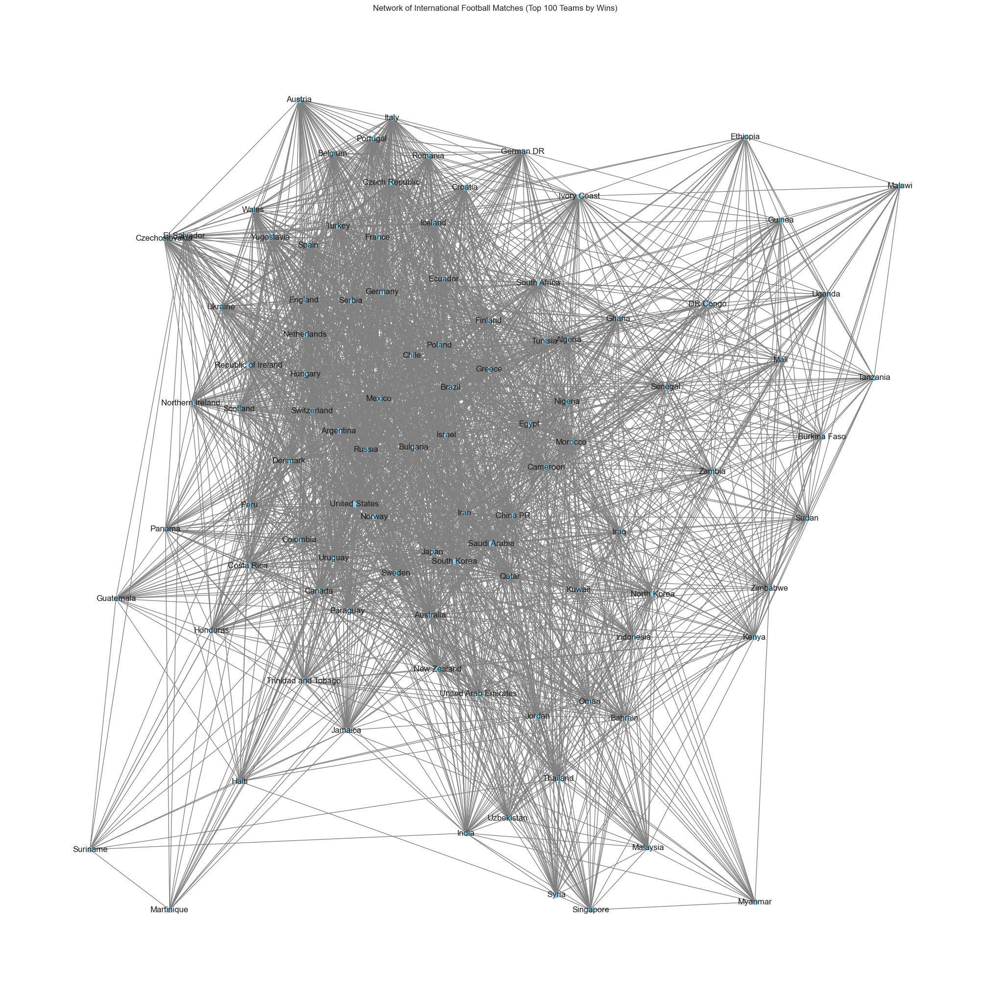

In [42]:
# function to determine the winner of a match
def winner(row):
    if row['home_score'] > row['away_score']:
        return row['home_team']
    elif row['home_score'] < row['away_score']:
        return row['away_team']
    else:
        return 'Draw'

# apply the function to each match
df_results['winner'] = df_results.apply(winner, axis=1)

# count wins for each team
win_counts = df_results[df_results['winner'] != 'Draw']['winner'].value_counts()

# identify top 100 teams based on number of wins
top_100_teams = win_counts.head(100).index.tolist()

# creating a network graph
G = nx.Graph()

# add edges between teams for each match
for index, row in df_results.iterrows():
    if row['home_team'] in top_100_teams and row['away_team'] in top_100_teams:
        G.add_edge(row['home_team'], row['away_team'])

# using a force-directed layout (spring layout)
pos = nx.spring_layout(G, k=0.15, iterations=20)

# drawing the network for top 100 teams
plt.figure(figsize=(20, 20))
nx.draw(G, pos, with_labels=True, node_size=50, font_size=12, node_color='skyblue', edge_color='gray')
plt.title('Network of International Football Matches (Top 100 Teams by Wins)')
plt.show()


This looks pretty but incomprehensible, so we can add a few modifications to make it easier to understand:
- Add a colour signifier based on continent
- Add weights to edges
- Increase node size based on wins

In [43]:
# preparing for the library
print(top_100_teams)

['Brazil', 'England', 'Germany', 'Argentina', 'Sweden', 'Mexico', 'South Korea', 'Hungary', 'Italy', 'France', 'Spain', 'Netherlands', 'Uruguay', 'Scotland', 'Denmark', 'Poland', 'Russia', 'Belgium', 'Zambia', 'Austria', 'Egypt', 'Japan', 'United States', 'Portugal', 'Romania', 'Saudi Arabia', 'Norway', 'Trinidad and Tobago', 'Ghana', 'Chile', 'Switzerland', 'Iran', 'Ivory Coast', 'China PR', 'Nigeria', 'Costa Rica', 'Uganda', 'Morocco', 'Australia', 'Tunisia', 'Iraq', 'Senegal', 'Paraguay', 'Malaysia', 'Kenya', 'Bulgaria', 'Kuwait', 'Cameroon', 'Thailand', 'Algeria', 'Qatar', 'Turkey', 'Jamaica', 'Republic of Ireland', 'Colombia', 'United Arab Emirates', 'Honduras', 'Greece', 'Wales', 'Indonesia', 'Czechoslovakia', 'Yugoslavia', 'Mali', 'Peru', 'Finland', 'Malawi', 'Haiti', 'South Africa', 'Zimbabwe', 'Croatia', 'DR Congo', 'Oman', 'Bahrain', 'Guinea', 'Guatemala', 'El Salvador', 'Czech Republic', 'Singapore', 'Northern Ireland', 'Ecuador', 'Israel', 'Canada', 'Suriname', 'Panama', 'M

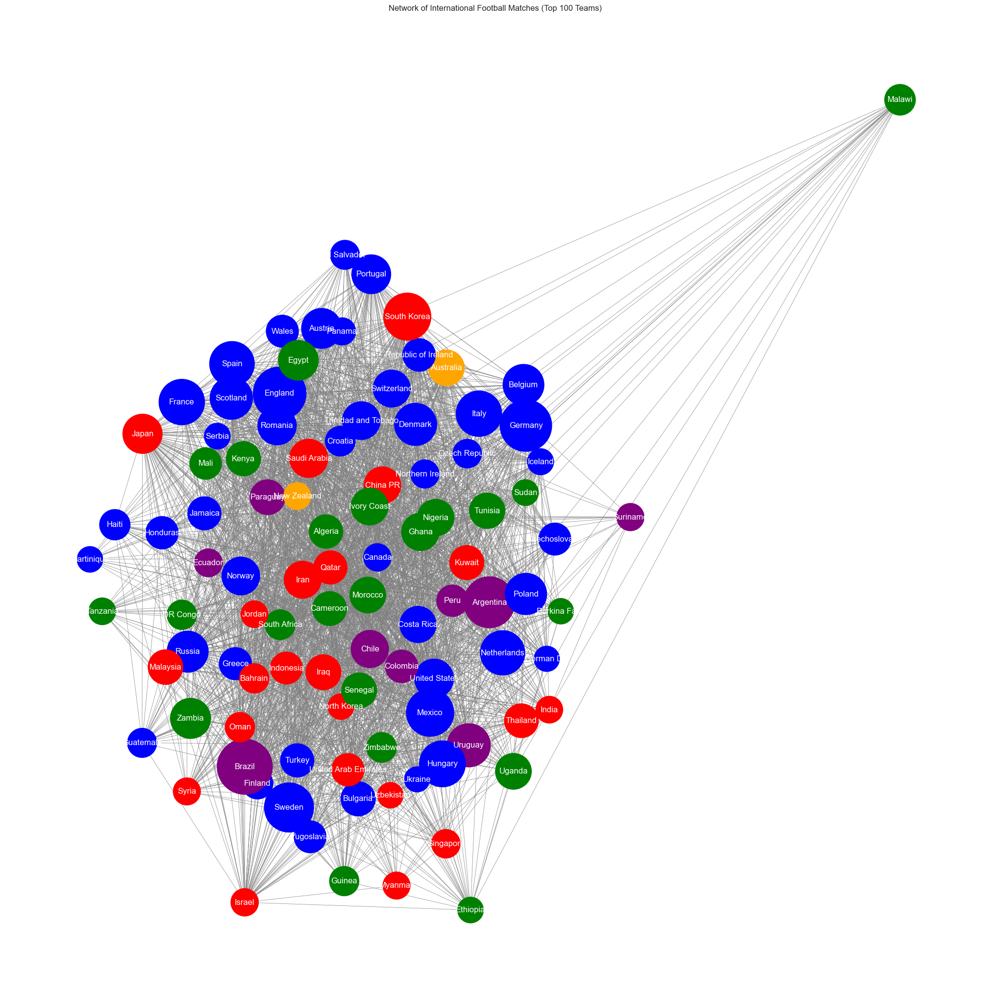

In [44]:
# creating a library to map continents
team_continent = {
    'Brazil': 'South America',
    'England': 'Europe',
    'Germany': 'Europe',
    'Argentina': 'South America',
    'Sweden': 'Europe',
    'Mexico': 'North and Central America',
    'South Korea': 'Asia',
    'Hungary': 'Europe',
    'Italy': 'Europe',
    'France': 'Europe',
    'Spain': 'Europe',
    'Netherlands': 'Europe',
    'Uruguay': 'South America',
    'Scotland': 'Europe',
    'Denmark': 'Europe',
    'Poland': 'Europe',
    'Russia': 'Europe',
    'Belgium': 'Europe',
    'Zambia': 'Africa',
    'Austria': 'Europe',
    'Egypt': 'Africa',
    'Japan': 'Asia',
    'United States': 'North and Central America',
    'Portugal': 'Europe',
    'Romania': 'Europe',
    'Saudi Arabia': 'Asia',
    'Norway': 'Europe',
    'Trinidad and Tobago': 'North and Central America',
    'Ghana': 'Africa',
    'Chile': 'South America',
    'Switzerland': 'Europe',
    'Iran': 'Asia',
    'Ivory Coast': 'Africa',
    'China PR': 'Asia',
    'Nigeria': 'Africa',
    'Costa Rica': 'North and Central America',
    'Uganda': 'Africa',
    'Morocco': 'Africa',
    'Australia': 'Oceania',
    'Tunisia': 'Africa',
    'Iraq': 'Asia',
    'Senegal': 'Africa',
    'Paraguay': 'South America',
    'Malaysia': 'Asia',
    'Kenya': 'Africa',
    'Bulgaria': 'Europe',
    'Kuwait': 'Asia',
    'Cameroon': 'Africa',
    'Thailand': 'Asia',
    'Algeria': 'Africa',
    'Qatar': 'Asia',
    'Turkey': 'Europe',
    'Jamaica': 'North and Central America',
    'Republic of Ireland': 'Europe',
    'Colombia': 'South America',
    'United Arab Emirates': 'Asia',
    'Honduras': 'North and Central America',
    'Greece': 'Europe',
    'Wales': 'Europe',
    'Indonesia': 'Asia',
    'Czechoslovakia': 'Europe',
    'Yugoslavia': 'Europe',
    'Mali': 'Africa',
    'Peru': 'South America',
    'Finland': 'Europe',
    'Malawi': 'Africa',
    'Haiti': 'North and Central America',
    'South Africa': 'Africa',
    'Zimbabwe': 'Africa',
    'Croatia': 'Europe',
    'DR Congo': 'Africa',
    'Oman': 'Asia',
    'Bahrain': 'Asia',
    'Guinea': 'Africa',
    'Guatemala': 'North and Central America',
    'El Salvador': 'North and Central America',
    'Czech Republic': 'Europe',
    'Singapore': 'Asia',
    'Northern Ireland': 'Europe',
    'Ecuador': 'South America',
    'Israel': 'Asia',
    'Canada': 'North and Central America',
    'Suriname': 'South America',
    'Panama': 'North and Central America',
    'Myanmar': 'Asia',
    'Syria': 'Asia',
    'New Zealand': 'Oceania',
    'Tanzania': 'Africa',
    'Jordan': 'Asia',
    'India': 'Asia',
    'Iceland': 'Europe',
    'Sudan': 'Africa',
    'Serbia': 'Europe',
    'North Korea': 'Asia',
    'Ethiopia': 'Africa',
    'Martinique': 'North and Central America',
    'Uzbekistan': 'Asia',
    'Burkina Faso': 'Africa',
    'German DR': 'Europe',
    'Ukraine': 'Europe'
}

# assign colors based on continents
continent_colors = {
    'Africa': 'green',
    'Asia': 'red',
    'Europe': 'blue',
    'North America': 'yellow',
    'South America': 'purple',
    'Oceania': 'orange'
}

# assigning colors to nodes
node_colors = [continent_colors.get(team_continent.get(team, 'Europe'), 'blue') for team in G.nodes()]

# initialize a new graph
G = nx.Graph()

# add edges with weights (number of matches played)
for index, row in df_results.iterrows():
    if row['home_team'] in top_100_teams and row['away_team'] in top_100_teams:
        if G.has_edge(row['home_team'], row['away_team']):
            G[row['home_team']][row['away_team']]['weight'] += 1
        else:
            G.add_edge(row['home_team'], row['away_team'], weight=1)

# node sizes based on wins
node_sizes = [win_counts[team]*10 for team in G.nodes()] # Multiplying by 10 for better visibility

# using a different layout
pos = nx.kamada_kawai_layout(G)

# drawing the network
plt.figure(figsize=(20, 20))
nx.draw(G, pos, with_labels=True, node_size=node_sizes, node_color=node_colors, edge_color='gray', width=0.5, font_color='white')
plt.title('Network of International Football Matches (Top 100 Teams)')
plt.show()


Removing Malawi to get a better view on the overall shape

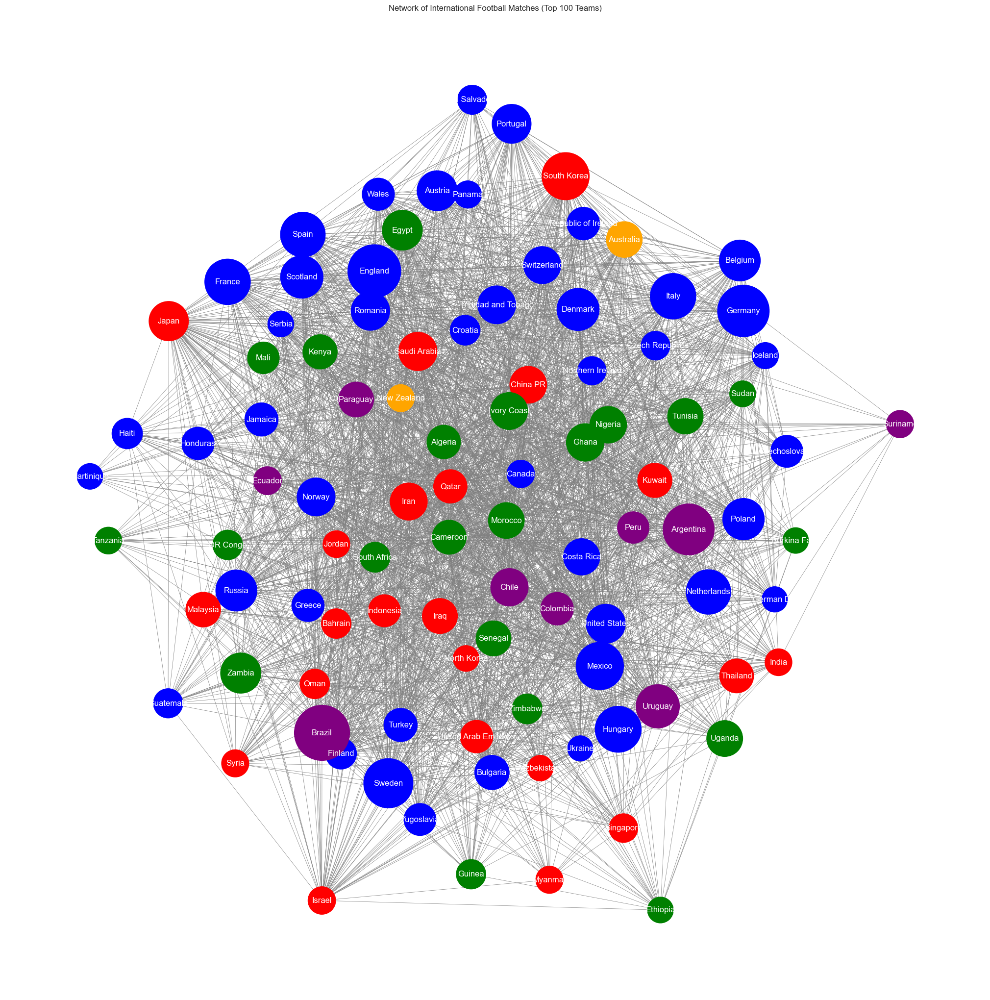

In [45]:
import matplotlib.pyplot as plt
import networkx as nx

# Assuming G is your graph and pos is your nodes' position

# Remove 'Malawi' from the graph
if 'Malawi' in G:
    G.remove_node('Malawi')

# Recalculate node colors without 'Malawi'
node_colors = [continent_colors.get(team_continent.get(team, 'Europe'), 'blue') for team in G.nodes()]

# Recalculate node sizes without 'Malawi'
default_size = 10  # Default size for nodes without specific size in win_counts
node_sizes = [win_counts.get(team, default_size)*10 for team in G.nodes()]

# Drawing the network
plt.figure(figsize=(20, 20))
nx.draw(G, pos, with_labels=True, node_size=node_sizes, node_color=node_colors, edge_color='gray', width=0.5, font_color='white')
plt.title('Network of International Football Matches (Top 100 Teams)')
plt.show()


In [46]:
print(len(node_sizes))
print(G.number_of_nodes())


99
99


In [47]:
# getting general stats
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
avg_degree = sum(dict(G.degree()).values()) / num_nodes


In [48]:
print("num_nodes", num_nodes)
print("num_edges", num_edges)
print("avg_degree", avg_degree)

num_nodes 99
num_edges 2679
avg_degree 54.121212121212125


In [49]:
# finding the highest degree nodes
degrees = dict(G.degree())
highest_degree_nodes = sorted(degrees.items(), key=lambda x: x[1], reverse=True)[:20]

highest_degree_nodes

[('South Korea', 85),
 ('Brazil', 80),
 ('Japan', 80),
 ('Morocco', 78),
 ('Saudi Arabia', 78),
 ('Egypt', 77),
 ('Mexico', 76),
 ('Iran', 76),
 ('Chile', 75),
 ('China PR', 75),
 ('United States', 74),
 ('Sweden', 73),
 ('Tunisia', 72),
 ('Norway', 71),
 ('Australia', 71),
 ('Qatar', 71),
 ('Uruguay', 70),
 ('Poland', 70),
 ('Argentina', 69),
 ('England', 68)]

In [50]:
from networkx.algorithms import community

# finding communities
communities = community.greedy_modularity_communities(G)

communities

[frozenset({'Argentina',
            'Austria',
            'Belgium',
            'Brazil',
            'Bulgaria',
            'Canada',
            'Chile',
            'Colombia',
            'Costa Rica',
            'Croatia',
            'Czech Republic',
            'Czechoslovakia',
            'Denmark',
            'Ecuador',
            'El Salvador',
            'England',
            'Finland',
            'France',
            'German DR',
            'Germany',
            'Greece',
            'Guatemala',
            'Haiti',
            'Honduras',
            'Hungary',
            'Iceland',
            'Israel',
            'Italy',
            'Jamaica',
            'Japan',
            'Martinique',
            'Mexico',
            'Netherlands',
            'New Zealand',
            'Northern Ireland',
            'Norway',
            'Panama',
            'Paraguay',
            'Peru',
            'Poland',
            'Portugal',
            'Qatar',
    

In [51]:
# sorting the edges
weighted_edges = sorted(G.edges(data=True), key=lambda x: x[2]['weight'], reverse=True)[:20]

weighted_edges

[('Uruguay', 'Argentina', {'weight': 180}),
 ('Austria', 'Hungary', {'weight': 137}),
 ('Belgium', 'Netherlands', {'weight': 127}),
 ('Scotland', 'England', {'weight': 118}),
 ('Kenya', 'Uganda', {'weight': 110}),
 ('Argentina', 'Brazil', {'weight': 109}),
 ('Sweden', 'Norway', {'weight': 109}),
 ('Sweden', 'Denmark', {'weight': 107}),
 ('Scotland', 'Wales', {'weight': 106}),
 ('Argentina', 'Paraguay', {'weight': 106}),
 ('England', 'Wales', {'weight': 105}),
 ('England', 'Northern Ireland', {'weight': 99}),
 ('Scotland', 'Northern Ireland', {'weight': 95}),
 ('Wales', 'Northern Ireland', {'weight': 94}),
 ('Sweden', 'Finland', {'weight': 91}),
 ('Argentina', 'Chile', {'weight': 88}),
 ('Norway', 'Denmark', {'weight': 85}),
 ('Uruguay', 'Chile', {'weight': 83}),
 ('Chile', 'Peru', {'weight': 83}),
 ('Brazil', 'Paraguay', {'weight': 81})]

#### Key Insights

- Our network analysis reveals a high degree of connectivity in the football world, with an average of 54 connections per team, indicating a dense and intricate pattern of international play.
- South Korea, Brazil, and Japan emerge as the most connected teams in the network, showcasing their extensive international engagement in football matches.
- The analysis uncovers two primary clusters of football interactions, one predominantly involving teams from Europe, South America, and North America, and the other featuring teams mainly from Africa and Asia. This reflects both global outreach and regional concentrations in the sport.
- A notable pattern is the prevalence of historic rivalries, particularly in South America, as seen in the frequent matchups like Uruguay versus Argentina. Such rivalries highlight the deep-rooted cultural and competitive aspects of football in these regions.
- The network also sheds light on regional dynamics, with many high-frequency matches occurring between neighboring countries, pointing to the importance of geographical proximity in shaping football rivalries and interactions.
- Interestingly, the analysis aligns with the trends observed in both friendly and competitive matches over the years, where shifts in play styles, defensive strategies, and overall football tactics are evident.
- This comprehensive network approach not only provides a snapshot of the current state of international football relations but also offers a historical perspective, tracing the evolution of the sport through its most prominent matches and rivalries.
- The insights gained from this network analysis can be instrumental in understanding how football has developed as a global sport, revealing patterns and connections that are not immediately apparent through traditional match-by-match analyses.

# Conclusion

In this comprehensive analysis of the "International Football Results from 1872 to 2017" dataset, we have unearthed several key trends and patterns in the realm of international football. Our focused approach, in line with the SMART criteria, has led us to meaningful insights in the specific areas of team performances, match outcomes, scoring patterns, and the nuances of home and away advantages. Here's a synthesis of our findings:

1. **Dominance of Top Teams**:
   - Brazil, England, Germany, Argentina, and Sweden emerged as the top teams in terms of match wins, reflecting their consistent performance in international football.
   - When considering win percentages, Brazil and Spain lead, showcasing their efficiency in converting matches into victories.

2. **Home vs. Away Advantage**:
   - Our analysis confirmed a significant home advantage in international football matches, with nearly 49% of matches resulting in home wins compared to about 28% for away wins.
   - The trend line from post-1940 data shows a gradual decline in home advantage, possibly due to advancements in transportation and technology.

3. **Scoring Patterns Over Time**:
   - The average goals per match in friendly games have decreased over the years, stabilizing around 2.5 to 3 goals in recent times.
   - Competitive matches also showed a similar trend, with a slight uptick in goals per match compared to friendlies, indicating a more attacking approach in competitive scenarios.

4. **Network Analysis of International Matches**:
   - A network graph of the top 100 teams based on wins highlighted the interconnectedness in international football, with dominant teams like Brazil, Germany, and Argentina forming central nodes in the network.

5. **Insights into Specific Metrics**:
   - The win percentage against top teams highlighted the competitive prowess of nations like Mali, France, and Zambia, who performed admirably against high-ranking teams.
   - The gradual decline in home win percentages post-1940 aligns with the global developments in transportation and communication.

6. **Statistical Confirmation of Home Advantage**:
   - The t-test analysis unequivocally rejected the null hypothesis, confirming a significant difference in mean scores for home and away teams.

In conclusion, our analysis provides a detailed and nuanced understanding of international football trends. The shift in scoring patterns, the dynamics of home and away advantages, and the performance of top teams over time offer valuable insights into the evolving nature of the sport. This exploration not only enriches the historical perspective of football but also contributes to the broader understanding of its global impact and development.